# "Поиск по изображениям с использованием текстовых описаний"  

### Название проекта:  

`"Image Search With Sense"` 

`а. Цель:`  

* Разработать и продемонстрировать концепцию поиска референсных фотографий на фотохостинге "Со Смыслом" с использованием текстовых описаний  

`б. Входные данные:`  

* Данные для обучения модели, включая изображения и текстовые описания  
* Оценки экспертов и данных с краудсорсинга для оценки соответствия описаний изображениям  
* Тестовые запросы и релевантные изображения  

`в. Задачи:`  

* Подготовка данных и их анализ  
* Исключение из обучающего датасета контента, подпадающего под юридические ограничения  
* Векторизация текстовых описаний с использованием BERT  
* Векторизация изображений с использованием модели ResNet50  
* Создание модели для оценки близости векторов  
* Обучение различных моделей, включая линейную регрессию и полносвязные нейронные сети  
* Тестирование лучшей модели на тестовых данных  
* Разработка функции для поиска релевантных изображений на основе текстовых запросов  


### Описание данных

В файле `train_dataset.csv` собрана информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## Импорт библиотек и установки

In [1]:
# !pip uninstall tensorflow
# !pip uninstall tensorflow-estimator
# !pip uninstall tensorboard
# !pip uninstall tensorflow-text

In [2]:
# ИСПРАВЛЕНО

!pip install -q spacy keras_nlp sentence_transformers
!python -m spacy download en_core_web_sm

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 49.2 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [3]:
# Импортируем необходимые библиотеки

import os
import warnings
import time
from tqdm import tqdm
from tqdm import notebook
tqdm.pandas()

from PIL import Image
from pathlib import Path


import math
from scipy import stats as st
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.model_selection import train_test_split, GridSearchCV, GroupShuffleSplit, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler
from sklearn.linear_model import LogisticRegression, LinearRegression, Ridge
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import accuracy_score, log_loss, f1_score, mean_squared_error


import re
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords as nltk_stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
import spacy

from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization, Reshape, RepeatVector, LSTM, Dropout
from tensorflow.keras.optimizers import Adam

import keras_nlp

import sentence_transformers
from sentence_transformers import SentenceTransformer, util
import glob

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Using TensorFlow backend


## Настройки и функции

In [4]:
def explore_dataframe(df):
    # Shape
    shape_info = pd.DataFrame({"Shape of dataframe": [f"Total: {df.shape[0]} rows, {df.shape[1]} columns"]})
    shape_info = shape_info.replace(np.nan, "-")
    
    # Data Types
    data_types_info = df.dtypes.to_frame().reset_index().rename(columns={"index": "Data Type", 0: ""})
    
    # Missing Values
    missing_values_info = df.isnull().sum().to_frame().reset_index().rename(columns={"index": "Missing Values", 0: ""})
    missing_values_info["Missing Values"] = missing_values_info["Missing Values"].fillna("-")
    
    # Duplicate Rows
    duplicate_rows_info = pd.DataFrame({"Duplicate Values": [f"Total: {df.duplicated().sum()}"]})
    duplicate_rows_info = duplicate_rows_info.replace(np.nan, "-")
    
     # Unique Values
    unique_values_info = df.nunique().to_frame().reset_index().rename(columns={"index": "Column", 0: "Unique Values"})
    
    # Describe
    describe_info = df.describe().transpose().reset_index().rename(columns={"index": "Column"})

    # Concatenate tables
    info_table = pd.concat([shape_info,data_types_info, missing_values_info, unique_values_info], axis=1) #shape_info, delite this for a while
    
    # Display tables
    display(df.sample())
    display(df.describe())  
    display(info_table)

In [5]:
BLOCK_WORDS = ['child', 'boy', 'girl', 'baby', 'teen', 'teenager', 'kid', 'infant', 'youngster', 'kids', 'children', 'boys', 'girls', 'babies', 'teens', 'teenagers', 'youth', 'toddler', 'adolescent', 'juvenile', 'offspring', 'minors', 'junior', 'tots', 'youthful', 'newborn', 'offspring', 'little one', 'munchkin', 'toddlers']

In [6]:
# Создание списка разных цветов для столбцов

colors = ['gray', 'pink', 'hotpink', 'lightgray', 'lightpink']

In [7]:
# Pandas defaults

pd.options.display.max_colwidth = 100
pd.options.display.max_rows = 500
pd.options.display.max_columns = 100
pd.options.display.float_format = '{:.3f}'.format
pd.options.display.colheader_justify = 'left'

In [8]:
# Disable warnings

warnings.filterwarnings('ignore')

## 1. Чтение данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения  

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи нужно эти оценки агрегировать — превратить в одну  

Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая  

Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета  

Вы можете воспользоваться другим методом агрегации оценок или придумать свой  

В файле с краудсорсинговыми оценками информация расположена в таком порядке: 

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке. 
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых нужно либо одну из них, либо объединить их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


In [9]:
# Пути к файлам
train_data_path = '/kaggle/input/dsplus-integrated-project-4/to_upload/train_dataset.csv'
crowd_annotations_path = '/kaggle/input/dsplus-integrated-project-4/to_upload/CrowdAnnotations.tsv'
expert_annotations_path = '/kaggle/input/dsplus-integrated-project-4/to_upload/ExpertAnnotations.tsv'
test_queries_path = '/kaggle/input/dsplus-integrated-project-4/to_upload/test_queries.csv'
test_images_path = '/kaggle/input/dsplus-integrated-project-4/to_upload/test_images'
train_images_path = '/kaggle/input/dsplus-integrated-project-4/to_upload/train_images'

In [10]:
# Загрузка данных
train_data = pd.read_csv(train_data_path)
train_data.name = 'train_data'

data_crowd = pd.read_csv(crowd_annotations_path, sep='\t', names=['image', 'query_id', 'fraction', 'pros', 'cons'])
data_crowd.name = 'data_crowd'

data_expert = pd.read_csv(expert_annotations_path, sep='\t', names=['image', 'query_id', 'first', 'second', 'third'])
data_expert.name = 'data_expert'

test_query = pd.read_csv(test_queries_path, index_col=[0], sep='|')
test_query.name = 'test_query'

In [11]:
test_images = []
for filename in os.listdir(test_images_path):
    if filename.endswith('.jpg'):
        image_path = os.path.join(test_images_path, filename)
        image = Image.open(image_path)
        test_images.append(image)

In [12]:
test_image = pd.DataFrame(test_images, columns=['image'])
test_image.name = 'test_image'

In [13]:
train_images = []
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):
        image_path = os.path.join(train_images_path, filename)
        image = Image.open(image_path)
        train_images.append(image)

In [14]:
train_image = pd.DataFrame(train_images, columns=['image'])
train_image.name = 'train_image'

In [15]:
datasets = [("Train Data", train_data), ("Data Crowd", data_crowd), ("Data Expert", data_expert), ("Test Query", test_query)]

for title, dataset in datasets:
    print(f"                                Exploring {title} Dataset")
    explore_dataframe(dataset)
    print("\n" + "="*100 + "\n")

                                Exploring Train Data Dataset


,image,query_id,query_text
3449,2497420371_74788d7ba1.jpg,3571147934_d1c8af1d6e.jpg#2,Kids are waiting at the bottom of a staircase attached to a brick building .


,image,query_id,query_text
count,5822,5822,5822
unique,1000,977,977
top,3364151356_eecd07a23e.jpg,2600867924_cd502fc911.jpg#2,"Two dogs , one brown and white and one black and white , run on a field ."
freq,10,34,34


,Shape of dataframe,Data Type,,Missing Values,,Column,Unique Values
0,"Total: 5822 rows, 3 columns",image,object,image,0,image,1000
1,NaN,query_id,object,query_id,0,query_id,977
2,NaN,query_text,object,query_text,0,query_text,977




                                Exploring Data Crowd Dataset


,image,query_id,fraction,pros,cons
29680,3262075846_5695021d84.jpg,3017521547_f5ef8848e3.jpg#2,0.000,0,3


,fraction,pros,cons
count,47830.000,47830.000,47830.000
mean,0.069,0.208,2.820
std,0.208,0.629,0.657
min,0.000,0.000,0.000
25%,0.000,0.000,3.000
50%,0.000,0.000,3.000
75%,0.000,0.000,3.000
max,1.000,5.000,6.000


,Shape of dataframe,Data Type,,Missing Values,,Column,Unique Values
0,"Total: 47830 rows, 5 columns",image,object,image,0,image,1000
1,NaN,query_id,object,query_id,0,query_id,1000
2,NaN,fraction,float64,fraction,0,fraction,12
3,NaN,pros,int64,pros,0,pros,6
4,NaN,cons,int64,cons,0,cons,7




                                Exploring Data Expert Dataset


,image,query_id,first,second,third
1380,2435685480_a79d42e564.jpg,2484190118_e89363c465.jpg#2,1,1,1


,first,second,third
count,5822.000,5822.000,5822.000
mean,1.437,1.624,1.882
std,0.787,0.856,0.904
min,1.000,1.000,1.000
25%,1.000,1.000,1.000
50%,1.000,1.000,2.000
75%,2.000,2.000,2.000
max,4.000,4.000,4.000


,Shape of dataframe,Data Type,,Missing Values,,Column,Unique Values
0,"Total: 5822 rows, 5 columns",image,object,image,0,image,1000
1,NaN,query_id,object,query_id,0,query_id,977
2,NaN,first,int64,first,0,first,4
3,NaN,second,int64,second,0,second,4
4,NaN,third,int64,third,0,third,4




                                Exploring Test Query Dataset


,query_id,query_text,image
147,2670637584_d96efb8afa.jpg#2,A girl sitting on the ground in the forest looking through binoculars .,2670637584_d96efb8afa.jpg


,query_id,query_text,image
count,500,500,500
unique,500,500,100
top,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1177994172_10d143cb8d.jpg
freq,1,1,5


,Shape of dataframe,Data Type,,Missing Values,,Column,Unique Values
0,"Total: 500 rows, 3 columns",query_id,object,query_id,0,query_id,500
1,NaN,query_text,object,query_text,0,query_text,500
2,NaN,image,object,image,0,image,100


`Train Data Dataset:`  
>Данный датасет содержит информацию о тренировочных изображениях, текстовых запросах и их соответствии. Всего в датасете `5822 записей`  
Уникальных изображений в данном датасете `1000`, уникальных запросов `977`  
Верхними наиболее часто встречающимися изображениями (top) являются изображения с идентификаторами `3364151356_eecd07a23e.jpg`, а наиболее часто встречающимися текстовыми запросами (top) являются запросы, содержащие изображение `2600867924_cd502fc911.jpg#2`  

`Data Crowd Dataset:`
>Этот датасет содержит информацию о разметке изображений, выполненной коллективом аннотаторов. Всего в датасете 47830 записей  
Столбец `"fraction"` указывает на долю положительных мнений аннотаторов относительно соответствия изображения запросу. Среднее значение этой доли составляет примерно `0.069`, что говорит о невысокой уверенности аннотаторов в соответствии изображения и запроса  
Столбец `"pros"` указывает на количество положительных аннотаций, а `"cons"` на количество отрицательных аннотаций. Средние значения `"pros"` и `"cons"` составляют соответственно примерно `0.208` и `2.820`  

`Data Expert Dataset:`
>Этот датасет содержит информацию о разметке изображений, выполненной экспертами. Всего в датасете `5822 записи`  
Столбцы `"first"`, `"second"` и `"third"` указывают на оценку экспертов относительно соответствия изображения и запроса. Средние значения для каждой из этих оценок находятся около `1.5`, что может расцениваться как умеренная степень соответствия    

`Test Query Dataset:`
>Этот датасет содержит информацию о тестовых запросах и изображениях. Всего в датасете `500 записей` 
Уникальных изображений в данном датасете `100`, что указывает на наличие разнообразных изображений для тестирования. Ни один запрос или изображение не повторяются в этом датасете

## Исследовательский анализ данных

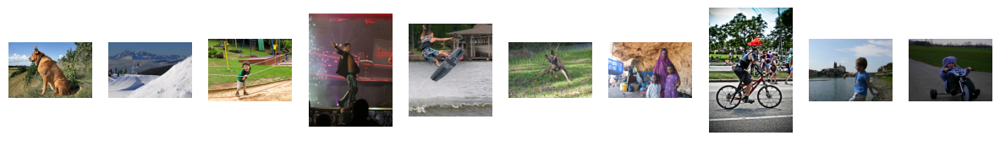

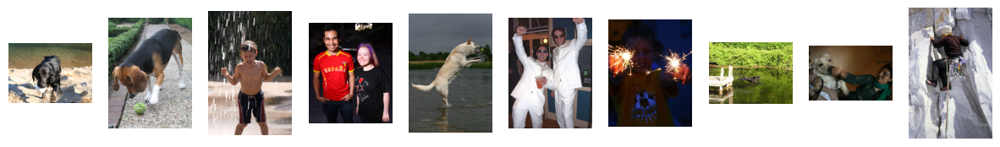

In [16]:
# Пути к папкам с изображениями
# test_images_path = '/kaggle/input/dsplus-integrated-project-4/to_upload/test_images'
# train_images_path = '/kaggle/input/dsplus-integrated-project-4/to_upload/train_images'

# Функция для вывода изображений из папки
def display_images_from_folder(folder_path, num_images=10):
    # Получаем список файлов из папки
    image_files = os.listdir(folder_path)
    num_images = min(num_images, len(image_files))  # Ограничиваем число выводимых изображений

    # Создаем сетку для отображения изображений
    fig, axes = plt.subplots(1, num_images, figsize=(15, 10))

    # Отображаем изображения
    for i in range(num_images):
        image_file = os.path.join(folder_path, image_files[i])
        image = Image.open(image_file)
        axes[i].imshow(image)
        axes[i].axis('off')

    plt.show()

# Выводим изображения из папки test_images
display_images_from_folder(test_images_path, num_images=10)

# Выводим изображения из папки train_images
display_images_from_folder(train_images_path, num_images=10)

In [17]:
# Создаем копию данных
fraction_counts = data_crowd.copy()

# Умножаем доли на 100 и приводим их к целочисленному типу
fraction_counts['fraction'] *= 100
fraction_counts['fraction'] = fraction_counts['fraction'].astype(int)

# Получаем количество записей для каждой доли
crowd_array = []
fraction_nums = np.array([0, 33, 66, 100])
for i in fraction_nums:
    crowd_array.append((fraction_counts['fraction'] == i).sum())

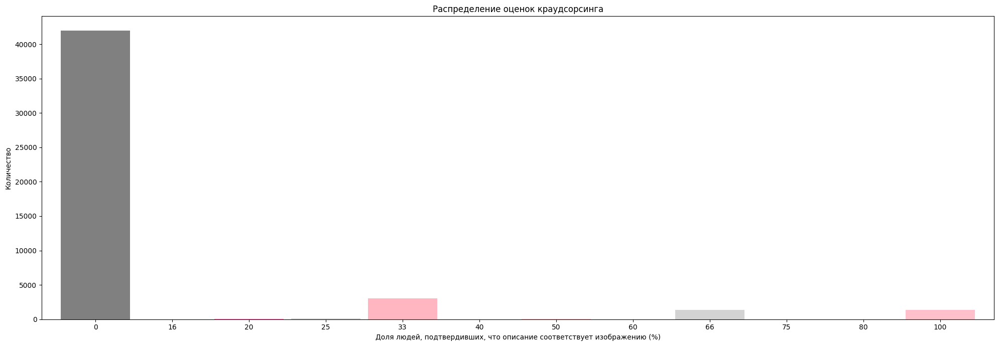

In [18]:
plt.figure(figsize=(20,7), facecolor='white')
plt.grid(color='gray', linestyle='--', linewidth=0.5)

fraction_counts['fraction'].value_counts().sort_index().plot(kind='bar', color=colors, width=0.9)

plt.xlabel('Доля людей, подтвердивших, что описание соответствует изображению (%)')
plt.ylabel('Количество')
plt.title('Распределение оценок краудсорсинга')
plt.xticks(rotation=0) 
plt.tight_layout()
plt.show()

In [19]:
def transform_range(x):
    return round((x - 1) / 3.0, 2)

def agr_data(row):
    """
    Функция агрегирует оценки экспертов.
    
    Args:
        row (pd.Series): Строка с оценками экспертов.
        
    Returns:
        pd.Series: Строка с агрегированными оценками.
    """
    # В случае, когда нет согласия между экспертными оценками, выполняется усреднение оценок и округление результата вниз
    
    if row['first'] != row['second'] != row['third']:
        row['agr_expert'] = math.floor((row['first'] + row['second'] + row['third']) / 3)
    else:
        row['agr_expert'] = int(np.median(row['first':'third']))
    
    return row

# Применяем функцию к DataFrame
data_expert = data_expert.progress_apply(agr_data, axis=1)

data_expert

100%|██████████| 5822/5822 [00:05<00:00, 992.02it/s] 


,image,query_id,first,second,third,agr_expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,1
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,1
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,1
...,...,...,...,...,...,...
5817,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,1,1,1,1
5818,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,1,1,1,1
5819,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,1,1,2,1
5820,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,1,1,1,1


In [20]:
print(data_expert.columns)

Index(['image', 'query_id', 'first', 'second', 'third', 'agr_expert'], dtype='object')


In [21]:
agr_expert_unique = data_expert['agr_expert'].unique()
agr_expert_unique

array([1, 2, 3, 4])

In [22]:
# Объединим два DataFrame с оценками экспертов и краудсорсинга
data_merged = pd.merge(data_expert, data_crowd, on=['image', 'query_id'], how='outer', suffixes=('_expert', '_crowd'))

# Можно также выбрать только интересующие столбцы после объединения, если остальные не нужны.
# data_merged = data_merged[['image', 'query_id', 'agr_expert', 'fraction']]

data_merged

,image,query_id,first,second,third,agr_expert,fraction,pros,cons
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1.000,1.000,1.000,1.000,0.000,0.000,3.000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1.000,1.000,2.000,1.000,0.000,0.000,3.000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1.000,1.000,2.000,1.000,NaN,NaN,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1.000,2.000,2.000,2.000,NaN,NaN,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1.000,1.000,2.000,1.000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
51318,997722733_0cb5439472.jpg,543007912_23fc735b99.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000
51319,997722733_0cb5439472.jpg,544576742_283b65fa0d.jpg#2,NaN,NaN,NaN,NaN,0.333,1.000,2.000
51320,997722733_0cb5439472.jpg,872622575_ba1d3632cc.jpg#2,NaN,NaN,NaN,NaN,1.000,3.000,0.000
51321,997722733_0cb5439472.jpg,888425986_e4b6c12324.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000


In [23]:
# Посчитаем количество пропущенных значений в столбцах 'agr_expert' и 'fraction' после объединения массивов
missing_agr_expert = data_merged['agr_expert'].isna().sum()
missing_fraction = data_merged['fraction'].isna().sum()

print(f'Количество NaN значений в столбце "agr_expert" после объединения: {missing_agr_expert}')
print(f'Количество NaN значений в столбце "fraction" после объединения: {missing_fraction}')
print()

Количество NaN значений в столбце "agr_expert" после объединения: 45501
Количество NaN значений в столбце "fraction" после объединения: 3493



In [24]:
# Выведем матрицу корреляции между 'agr_expert' и 'fraction'
correlation_matrix = data_merged[['agr_expert', 'fraction']].corr()
print('Матрица корреляции между "agr_expert" и "fraction":')
display(correlation_matrix)

Матрица корреляции между "agr_expert" и "fraction":


,agr_expert,fraction
agr_expert,1.000,0.762
fraction,0.762,1.000


In [25]:
# Создадим копию датафрейма без пропущенных значений
data_merged_notnan = data_merged.dropna()

In [26]:
# Для каждого уникального значения agr_expert вычислим среднее и стандартное отклонение в столбце fraction
for i in agr_expert_unique:
    subset = data_merged_notnan[data_merged_notnan['agr_expert'] == i]
    mean_fraction = subset['fraction'].mean()
    std_fraction = subset['fraction'].std()
    print(f'Средняя доля людей, подтвердивших, что описание соответствует изображению (%) при оценке экспертов равной {i}:',
          '{:.0%}'.format(mean_fraction),
          ', std:',
          '{:.0%}'.format(std_fraction))
    
# Выведем уникальные значения столбца agr_expert с их количеством
print()
print('Уникальные значения столбца agr_expert')
print(data_merged_notnan['agr_expert'].value_counts())
print()
# Выведем уникальные значения столбца fraction с их количеством
print('Уникальные значения значений столбца fraction')
print(data_merged_notnan['fraction'].value_counts())

Средняя доля людей, подтвердивших, что описание соответствует изображению (%) при оценке экспертов равной 1: 0% , std: 3%
Средняя доля людей, подтвердивших, что описание соответствует изображению (%) при оценке экспертов равной 2: 5% , std: 14%
Средняя доля людей, подтвердивших, что описание соответствует изображению (%) при оценке экспертов равной 3: 31% , std: 32%
Средняя доля людей, подтвердивших, что описание соответствует изображению (%) при оценке экспертов равной 4: 89% , std: 20%

Уникальные значения столбца agr_expert
agr_expert
2.000    957
1.000    604
3.000    463
4.000    305
Name: count, dtype: int64

Уникальные значения значений столбца fraction
fraction
0.000    1633
1.000     263
0.333     257
0.667     158
0.250       6
0.500       4
0.200       2
0.400       2
0.800       2
0.750       2
Name: count, dtype: int64


In [27]:
# Определим функцию для разделения данных на категории на основе значения fraction и статистики
def agr_merge(row):
    """
    Функция для категоризации данных на основе значения fraction и статистики.

    Args:
        row (pd.Series): Строка с данными.

    Returns:
        float: Категория для данной строки.
    """
    if row['fraction'] >= 0.75:
        return 4.0
    elif row['fraction'] >= 0.25:
        return 3.0
    elif row['fraction'] >= 0.10:
        return 2.0
    return 1.0

In [28]:
# Создаем таблицу для проведения анализа и сравнения методов
features_func = data_merged[['agr_expert', 'fraction']].copy()
features_func.dropna(inplace=True)
features_func['predict'] = features_func.apply(agr_merge, axis=1)

In [29]:
# Создаем пустой DataFrame для хранения результатов анализа моделей
agr_expert_models = pd.DataFrame(columns=['ACC'])

def update_model_results(df, model_name, accuracy):
    '''
    Добавляет результаты анализа модели в таблицу.

    Parameters:
        df (pd.DataFrame): Таблица для хранения результатов.
        model_name (str): Название модели.
        accuracy (float): Точность модели.

    Returns:
        pd.DataFrame: Обновленная таблица с результатами.
    '''
    df.loc[model_name, 'ACC'] = accuracy
    return df

# Добавляем результаты анализа BaseLine модели
update_model_results(agr_expert_models,
                     'BaseLine',
                     round(accuracy_score(features_func['predict'], features_func['agr_expert']), 4))

,ACC
BaseLine,0.454


In [30]:
data_merged_expert = data_merged.copy()
data_merged_expert.dropna(inplace=True)

# Отделяем признаки и целевую переменную
features = data_merged_expert[['fraction', 'pros', 'cons']]
target = data_merged_expert['agr_expert']

print(f"Размерность признаков (features): {features.shape}")
print(f"Размерность целевой переменной (target): {target.shape}")

Размерность признаков (features): (2329, 3)
Размерность целевой переменной (target): (2329,)


In [31]:
features_train, features_test, target_train, target_test = train_test_split(features,
                                                                            target,
                                                                            test_size=0.25,
                                                                            random_state=12345)

In [32]:
# Обучаем модель логистической регрессии с учетом несбалансированных классов и задаем случайное состояние
model_lr = LogisticRegression(class_weight="balanced", random_state=12345).fit(features_train, target_train)

# Получаем прогнозы модели
predictions = model_lr.predict(features_test)

# Добавляем результаты анализа в таблицу с анализом моделей
update_model_results(agr_expert_models,
            'LogisticRegression',
            round(accuracy_score(predictions, target_test), 4))

,ACC
BaseLine,0.454
LogisticRegression,0.451


In [33]:
# Обучаем модель метода опорных векторов (SVC) с учетом несбалансированных классов,
# используя сигмоидное (sigmoid) ядро, так как данные не обладают сильной линейной зависимостью
model_svc = SVC(class_weight="balanced", kernel='sigmoid').fit(features_train, target_train)

# Получаем прогнозы модели
predictions = model_svc.predict(features_test)

# Добавляем результаты анализа в таблицу с анализом моделей
update_model_results(agr_expert_models,'SVC',round(accuracy_score(predictions, target_test), 4))

,ACC
BaseLine,0.454
LogisticRegression,0.451
SVC,0.460


In [34]:
# Обучаем модель случайного леса (RandomForestClassifier) с учетом несбалансированных классов
model_rfc = RandomForestClassifier(class_weight="balanced").fit(features_train, target_train)

# Получаем прогнозы модели
predictions = model_rfc.predict(features_test)

# Добавляем результаты анализа в таблицу с анализом моделей
update_model_results(agr_expert_models,'RandomForestClassifier',round(accuracy_score(predictions, target_test), 4))

,ACC
BaseLine,0.454
LogisticRegression,0.451
SVC,0.460
RandomForestClassifier,0.449


In [35]:
# Сортируем таблицу с результатами анализа моделей по метрике точности (ACC) в убывающем порядке
agr_expert_models.sort_values(by='ACC', ascending=False)

,ACC
SVC,0.460
BaseLine,0.454
LogisticRegression,0.451
RandomForestClassifier,0.449


In [36]:
# Создаем таблицу для анализа моделей, в которой будем хранить RMSE
fraction_models = pd.DataFrame(columns=['RMSE'])

def alter_table(df, model_name, rmse):
    '''Добавляет в нашу таблицу с анализом моделей данные'''
    
    # Записываем значение RMSE для указанной модели
    fraction_models.loc[model_name, 'RMSE'] = rmse
    
    return df

In [37]:
# Выбираем признаки (features) и целевую переменную (target)
features = data_merged_expert[['first', 'second', 'third', 'agr_expert']]
target = data_merged_expert.fraction

# Выводим размерности выборки
print("Размерность признаков (features):", features.shape)
print("Размерность целевой переменной (target):", target.shape)

Размерность признаков (features): (2329, 4)
Размерность целевой переменной (target): (2329,)


In [38]:
features_train, features_test, target_train, target_test = train_test_split(features,
                                                                            target,
                                                                            test_size=0.25,
                                                                            random_state=12345)

In [39]:
# Обучаем модель линейной регрессии
model_lr = LinearRegression().fit(features_train, target_train)

# Получаем предсказания модели на тестовой выборке
predictions = model_lr.predict(features_test)

# Добавляем результаты анализа в таблицу fraction_models
alter_table(fraction_models,
            'LinearRegression',
            round(np.sqrt(mean_squared_error(target_test, predictions)), 4))

# Выводим таблицу fraction_models
fraction_models

,RMSE
LinearRegression,0.213


In [40]:
# Обучаем модель гребневой регрессии
model_r = Ridge().fit(features_train, target_train)

# Получаем предсказания модели на тестовой выборке
predictions = model_r.predict(features_test)

# Добавляем результаты анализа в таблицу fraction_models
alter_table(fraction_models,
            'Ridge',
            round(np.sqrt(mean_squared_error(target_test, predictions)), 4))

# Выводим таблицу fraction_models
fraction_models

,RMSE
LinearRegression,0.213
Ridge,0.213


In [41]:
# Обучаем модель случайного леса для регрессии
model_rfr = RandomForestRegressor().fit(features_train, target_train)

# Получаем предсказания модели на тестовой выборке
predictions = model_rfr.predict(features_test)

# Добавляем результаты анализа в таблицу fraction_models
alter_table(fraction_models,
            'RandomForestRegressor',
            round(np.sqrt(mean_squared_error(target_test, predictions)), 4))

# Сортируем таблицу fraction_models по значению RMSE в возрастающем порядке
fraction_models.sort_values(by='RMSE')

,RMSE
RandomForestRegressor,0.179
LinearRegression,0.213
Ridge,0.213


In [42]:
# Определяем сетку гиперпараметров, которые будем исследовать
grid_params = {'n_estimators': np.arange(50, 110, 10),
               'max_depth': np.arange(9, 16),
               'criterion': ['squared_error', 'absolute_error']}

# Создаем объект GridSearchCV для поиска лучших гиперпараметров случайного леса
grid = GridSearchCV(RandomForestRegressor(), grid_params, cv=3, verbose=1, error_score='raise')

# Обучаем объект GridSearchCV на обучающей выборке
grid.fit(features_train, target_train)

# Получаем лучшую модель с наилучшими гиперпараметрами
model_cv = grid.best_estimator_

Fitting 3 folds for each of 84 candidates, totalling 252 fits


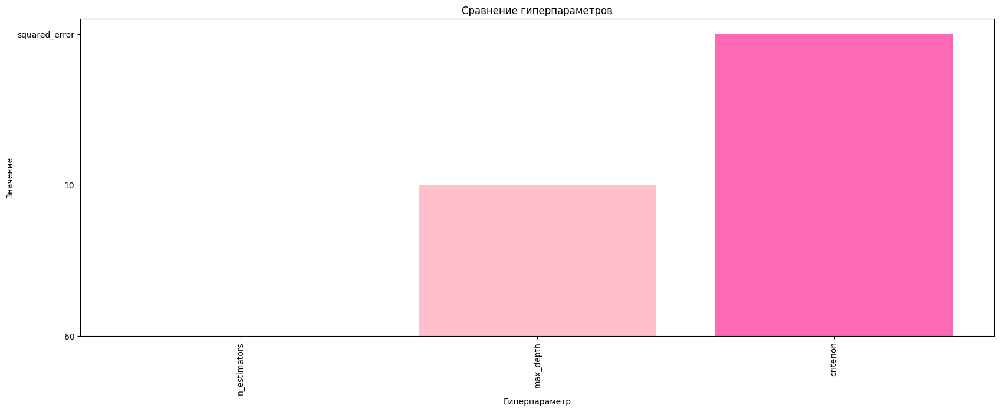

In [43]:
# Сравнение параметров модели
param_names = ['n_estimators', 'max_depth', 'criterion']
param_values = [str(grid.best_params_[param]) for param in param_names]

plt.figure(figsize=(20, 7))
plt.bar(param_names, param_values, color=colors)
plt.title('Сравнение гиперпараметров')
plt.xlabel('Гиперпараметр')
plt.ylabel('Значение')
plt.xticks(rotation=90)
plt.show()

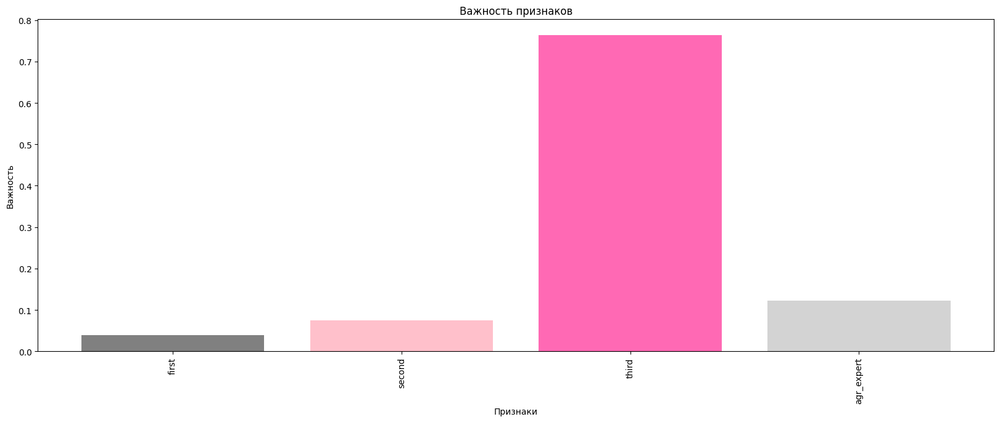

In [44]:
# Важность признаков
feature_importance = grid.best_estimator_.feature_importances_

plt.figure(figsize=(20, 7))
plt.bar(range(len(feature_importance)), feature_importance, color=colors, tick_label=features_train.columns)
plt.title('Важность признаков')
plt.xlabel('Признаки')
plt.ylabel('Важность')
plt.xticks(rotation=90)  
plt.show()

In [45]:
# Получаем прогнозы с использованием лучшей модели
predictions = model_cv.predict(features_test)

# Вычисляем и выводим значение RMSE (корень из средней квадратичной ошибки)
rmse = np.sqrt(mean_squared_error(target_test, predictions))
print(f"RMSE на тестовой выборке: {rmse:.4f}")

RMSE на тестовой выборке: 0.1789


In [46]:
data_merged

,image,query_id,first,second,third,agr_expert,fraction,pros,cons
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1.000,1.000,1.000,1.000,0.000,0.000,3.000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1.000,1.000,2.000,1.000,0.000,0.000,3.000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1.000,1.000,2.000,1.000,NaN,NaN,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1.000,2.000,2.000,2.000,NaN,NaN,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1.000,1.000,2.000,1.000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
51318,997722733_0cb5439472.jpg,543007912_23fc735b99.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000
51319,997722733_0cb5439472.jpg,544576742_283b65fa0d.jpg#2,NaN,NaN,NaN,NaN,0.333,1.000,2.000
51320,997722733_0cb5439472.jpg,872622575_ba1d3632cc.jpg#2,NaN,NaN,NaN,NaN,1.000,3.000,0.000
51321,997722733_0cb5439472.jpg,888425986_e4b6c12324.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000


In [47]:
# Заполним пропущенные значения с помощью заранее обученных моделей
def fill_nan(row):
    # Если значение 'agr_expert' пропущено, заполняем его прогнозом модели model_svc
    if np.isnan(row['agr_expert']):
        a = model_svc.predict([[row['fraction'], row['pros'], row['cons']]])[0]
        row['agr_expert'] = a
    # Если значение 'fraction' пропущено, заполняем его прогнозом модели model_cv
    elif np.isnan(row['fraction']):
        b = np.round((model_cv.predict([[row['first'], row['second'], row['third'], row['agr_expert']]]))[0], 6)
        row['fraction'] = b

    return row

# Применяем функцию fill_nan к каждой строке в DataFrame data_merged
data_merged = data_merged.progress_apply(fill_nan, axis=1)
data_merged

100%|██████████| 51323/51323 [00:32<00:00, 1577.03it/s]


,image,query_id,first,second,third,agr_expert,fraction,pros,cons
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1.000,1.000,1.000,1.000,0.000,0.000,3.000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1.000,1.000,2.000,1.000,0.000,0.000,3.000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1.000,1.000,2.000,1.000,0.001,NaN,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1.000,2.000,2.000,2.000,0.013,NaN,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1.000,1.000,2.000,1.000,0.001,NaN,NaN
...,...,...,...,...,...,...,...,...,...
51318,997722733_0cb5439472.jpg,543007912_23fc735b99.jpg#2,NaN,NaN,NaN,1.000,0.000,0.000,3.000
51319,997722733_0cb5439472.jpg,544576742_283b65fa0d.jpg#2,NaN,NaN,NaN,3.000,0.333,1.000,2.000
51320,997722733_0cb5439472.jpg,872622575_ba1d3632cc.jpg#2,NaN,NaN,NaN,4.000,1.000,3.000,0.000
51321,997722733_0cb5439472.jpg,888425986_e4b6c12324.jpg#2,NaN,NaN,NaN,1.000,0.000,0.000,3.000


In [48]:
# Применим линейное преобразование к столбцу 'agr_expert' с оценками в диапазоне [1, 4] -> [0, 1]
data_merged['agr_expert'] = (data_merged['agr_expert'] - 1) / 3.0

data_merged['agr_expert'] = round(data_merged['agr_expert'], 2)

data_merged

,image,query_id,first,second,third,agr_expert,fraction,pros,cons
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1.000,1.000,1.000,0.000,0.000,0.000,3.000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1.000,1.000,2.000,0.000,0.000,0.000,3.000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1.000,1.000,2.000,0.000,0.001,NaN,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1.000,2.000,2.000,0.330,0.013,NaN,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1.000,1.000,2.000,0.000,0.001,NaN,NaN
...,...,...,...,...,...,...,...,...,...
51318,997722733_0cb5439472.jpg,543007912_23fc735b99.jpg#2,NaN,NaN,NaN,0.000,0.000,0.000,3.000
51319,997722733_0cb5439472.jpg,544576742_283b65fa0d.jpg#2,NaN,NaN,NaN,0.670,0.333,1.000,2.000
51320,997722733_0cb5439472.jpg,872622575_ba1d3632cc.jpg#2,NaN,NaN,NaN,1.000,1.000,3.000,0.000
51321,997722733_0cb5439472.jpg,888425986_e4b6c12324.jpg#2,NaN,NaN,NaN,0.000,0.000,0.000,3.000


In [49]:
# Удалим столбцы с пропущенными значениями, так как они не будут полезными для модели
data_merged.dropna(axis=1, inplace=True)

data_merged

,image,query_id,agr_expert,fraction
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000,0.000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000,0.000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000,0.001
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.330,0.013
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000,0.001
...,...,...,...,...
51318,997722733_0cb5439472.jpg,543007912_23fc735b99.jpg#2,0.000,0.000
51319,997722733_0cb5439472.jpg,544576742_283b65fa0d.jpg#2,0.670,0.333
51320,997722733_0cb5439472.jpg,872622575_ba1d3632cc.jpg#2,1.000,1.000
51321,997722733_0cb5439472.jpg,888425986_e4b6c12324.jpg#2,0.000,0.000


In [50]:
# Производим агрегацию оценок, учитывая как мнение экспертов, так и оценку краудсорсинга.
# Вес мнения экспертов составляет 75%, а вес оценки краудсорсинга - 25%.
def scoring(row):
    row['score'] = row['agr_expert'] * 0.75 + row['fraction'] * 0.25
    return row

# Применяем функцию scoring к каждой строке датасета.
data_merged = data_merged.progress_apply(scoring, axis=1)

display(data_merged)

display(data_merged.describe())

100%|██████████| 51323/51323 [00:35<00:00, 1462.46it/s]


,image,query_id,agr_expert,fraction,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000,0.000,0.000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000,0.000,0.000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000,0.001,0.000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.330,0.013,0.251
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000,0.001,0.000
...,...,...,...,...,...
51318,997722733_0cb5439472.jpg,543007912_23fc735b99.jpg#2,0.000,0.000,0.000
51319,997722733_0cb5439472.jpg,544576742_283b65fa0d.jpg#2,0.670,0.333,0.586
51320,997722733_0cb5439472.jpg,872622575_ba1d3632cc.jpg#2,1.000,1.000,1.000
51321,997722733_0cb5439472.jpg,888425986_e4b6c12324.jpg#2,0.000,0.000,0.000


,agr_expert,fraction,score
count,51323.000,51323.000,51323.000
mean,0.103,0.065,0.094
std,0.249,0.201,0.233
min,0.000,0.000,0.000
25%,0.000,0.000,0.000
50%,0.000,0.000,0.000
75%,0.000,0.000,0.000
max,1.000,1.000,1.000


In [51]:
# Объединим train_data с получившимся массивом data_merged по столбцам 'image' и 'query_id'
train_data = pd.merge(train_data, data_merged[['image', 'query_id', 'score']], how='outer', on=['image', 'query_id'])

In [52]:
explore_dataframe(train_data)

,image,query_id,query_text,score
50243,751737218_b89839a311.jpg,172097782_f0844ec317.jpg#2,NaN,0.000


,score
count,51323.000
mean,0.094
std,0.233
min,0.000
25%,0.000
50%,0.000
75%,0.000
max,1.000


,Shape of dataframe,Data Type,,Missing Values,,Column,Unique Values
0,"Total: 51323 rows, 4 columns",image,object,image,0,image,1000
1,NaN,query_id,object,query_id,0,query_id,1000
2,NaN,query_text,object,query_text,45501,query_text,977
3,NaN,score,float64,score,0,score,43


In [53]:
# Для дальнейшей обработки и заполнения NaN значений создадим отдельный DataFrame в котором будут только строки где столбец 'query_text' без NaN 
notna_train = train_data[train_data['query_text'].notna()]

In [54]:
# Для проверки ситуации, когда у одного id есть несколько значений, выберем индекс idx
idx = 9746

print(train_data.iloc[idx])

# Затем, для определенного query_id (qid) из этой строки, выведем соответствующие ему значения 'query_text'из DataFrame notna_train, где 'query_text' без NaN значения
qid = train_data.iloc[idx]['query_id']
notna_train.loc[notna_train['query_id'] == qid]['query_text']

image           1682079482_9a72fa57fa.jpg
query_id      3564312955_716e86c48b.jpg#2
query_text                            NaN
score                               0.000
Name: 9746, dtype: object


3856    a smiling toddler in a pink swimsuit is laying in the water .
3857    a smiling toddler in a pink swimsuit is laying in the water .
3858    a smiling toddler in a pink swimsuit is laying in the water .
3859    a smiling toddler in a pink swimsuit is laying in the water .
3860    a smiling toddler in a pink swimsuit is laying in the water .
3861    a smiling toddler in a pink swimsuit is laying in the water .
Name: query_text, dtype: object

In [55]:
# Заполним все пропущенные значения в столбце 'query_text' на основе 'query_id'
def fillna_train(row):
    
    if pd.isnull(row['query_text']):
        text = notna_train[notna_train['query_id'] == row['query_id']]['query_text']
        if len(text) != 0:
            row['query_text'] = text.iloc[0]
    return row

# Применяем функцию для заполнения пропущенных значений
train_data = train_data.progress_apply(fillna_train, axis=1)

100%|██████████| 51323/51323 [01:17<00:00, 664.78it/s]


In [56]:
explore_dataframe(train_data)

,image,query_id,query_text,score
28542,3072114570_e1c0127529.jpg,1329832826_432538d331.jpg#2,People waiting to cross the street in front of a pharmacy with lit up sign .,0.000


,score
count,51323.000
mean,0.094
std,0.233
min,0.000
25%,0.000
50%,0.000
75%,0.000
max,1.000


,Shape of dataframe,Data Type,,Missing Values,,Column,Unique Values
0,"Total: 51323 rows, 4 columns",image,object,image,0,image,1000
1,NaN,query_id,object,query_id,0,query_id,1000
2,NaN,query_text,object,query_text,1109,query_text,977
3,NaN,score,float64,score,0,score,43


In [57]:
# Удалим строки с NaN значениями, для которых не было найдено соответствующего 'query_id'
train_data.dropna(inplace=True)

display(train_data.head(10))
train_data.info()

,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.247
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,1.000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.000
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.247
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.000
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.000
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.000
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.000


<class 'pandas.core.frame.DataFrame'>
Index: 50214 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       50214 non-null  object 
 1   query_id    50214 non-null  object 
 2   query_text  50214 non-null  object 
 3   score       50214 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.9+ MB


In [58]:
# Выберем строки, где значение 'score' больше 70%
limit = 0.7
limit_data = train_data[train_data['score'] > limit]

display(limit_data)

,image,query_id,query_text,score
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,1.000
16,2718495608_d8533e3ac5.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses smiles .,1.000
74,1425069308_488e5fcf9d.jpg,1425069308_488e5fcf9d.jpg#2,A white dog jumps to catch a blue ball in a living room .,1.000
86,2140182410_8e2a06fbda.jpg,2140182410_8e2a06fbda.jpg#2,The kid is on a float in the snow .,1.000
110,3119076670_64b5340530.jpg,3119076670_64b5340530.jpg#2,Snowboarder in the air performing a stunt .,1.000
...,...,...,...,...
51046,925491651_57df3a5b36.jpg,1772859261_236c09b861.jpg#2,A dog splashes through the water .,1.000
51062,925491651_57df3a5b36.jpg,2541104331_a2d65cfa54.jpg#2,a dog pounces into the water .,1.000
51152,929679367_ff8c7df2ee.jpg,929679367_ff8c7df2ee.jpg#2,A puppy is playing with a tennis ball on a well-kept path lined with groomed bushes .,1.000
51238,968081289_cdba83ce2e.jpg,968081289_cdba83ce2e.jpg#2,Two boys jumping off the pier into the water .,1.000


### Вывод

На данном этапе работы было предоставлено 5 различных датафреймов, однако основная работа проводилась с тремя из них:  

`train_data` - это датафрейм, содержащий информацию, необходимую для обучения моделей. Он состоит из 5822 наблюдений, где каждое наблюдение представляет собой соответствие между изображением и его описанием  

`CrowdAnnotations` - это таблица с оценками соответствия описания к изображению, полученными с помощью краудсорсинга. Она содержит 47830 наблюдений 

`ExpertAnnotations`  - это таблица с оценками, полученными в результате опроса экспертов, и содержит 5822 наблюдения  

**Основная задача на данном этапе заключалась в агрегации оценок из двух последних таблиц в единую метрику в диапазоне от 0 до 1. Для этого были выбраны следующие метрики:**  

>Для CrowdAnnotations выбрана доля людей, подтвердивших, что описание соответствует изображению (далее - "fraction")

>Для ExpertAnnotations применен следующий метод агрегации: если оценки трех экспертов различались, то бралось среднее значение, в противном случае бралась мода (далее - "agr_expert")  

>Объединив две таблицы, получилось большое количество пропущенных значений (NaN), которые нельзя было просто удалить, так как это привело бы к потере большого объема информации. Поэтому был проведен анализ данных, оценив корреляцию между двумя метриками (fraction и agr_expert) выяснили, что они имеют 76% положительную корреляцию. Также была построена базовая модель, которая заполняла значения agr_expert на основе порога в долю процента  

>Затем протестировали три различные модели для многоклассовой классификации: случайный лес, логистическую регрессию и опорные векторы с сигмоидальным ядром  

>Далее была поставлена задача получения метрики fraction из agr_expert. Для этого мы использовали линейную регрессию как эталонную модель, так как написание новой функции не имело смысла. Всего было протестировано три модели, и лучший результат показала модель случайного леса (Random Forest), которая достигла среднеквадратичной ошибки (RMSE) на уровне 17% после подгонки параметров с помощью GridSearchCV  

>С помощью выбранных моделей мы заполнили все пропущенные значения, а затем восстановили пропущенные значения в исходном датафрейме train_data с помощью информации из столбца query_id  

>Таким образом, наша итоговая обучающая выборка (train_data) содержит 50214 наблюдений и готова к дальнейшей работе  

**Отметим, что в процессе обработки данных была потеряна часть информации, около 2%, что приемлемо для дальнейшего анализа и моделирования**

## Проверка данных на юридическое соответствие

Без согласия родителей или законных представителей нельзя распространять информацию, включая тексты, изображения и аудиозаписи, отображающие или описывающие детей до 16 лет. Данный сервис строго соблюдает эти нормы, и при попытке просмотра запрещенных изображений пользователю выводится дисклеймер. Однако в нашем PoC такой функционал отсутствует, поэтому все изображения, нарушающие эти требования, необходимо исключить из обучающей выборки. 

In [59]:
print(nltk.data.path)

['/root/nltk_data', '/usr/share/nltk_data', '/usr/local/share/nltk_data', '/usr/lib/nltk_data', '/usr/local/lib/nltk_data']


In [60]:
# Загрузка необходимых ресурсов для NLTK

nltk.download('punkt')
nltk.download('omw-1.4')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [61]:
nlp = spacy.load("en_core_web_sm")

In [62]:
def lemmatize_text(phrase):
    # Приведение текста к нижнему регистру и удаление символов, кроме букв
    phrase = re.sub('[^a-zA-Z]', ' ', phrase).lower()
    # Лемматизация текста с использованием spaCy
    doc = nlp(phrase)
    lemmatized_text = ' '.join([token.lemma_ for token in doc])  
    return lemmatized_text

In [63]:
# Функция для блокировки текстов с определенными словами
def blocking(row):
    if isinstance(row['query_text'], str):  # Проверяем, является ли 'query_text' строкой
        # Лемматизация текста с использованием spaCy
        lemmatized_text = lemmatize_text(row['query_text'])
        # Поиск слов из списка BLOCK_WORDS в лемматизированном тексте
        block_words_found = any(word in lemmatized_text for word in BLOCK_WORDS)
        # Возвращаем 1, если есть блокирующие слова, и 0 в противном случае
        return 1 if block_words_found else 0
    else:
        return 0  # Если 'query_text' не является строкой, возвращаем 0

In [64]:
# Применение функции блокировки к датафрейму
train_data['block_words'] = train_data.apply(blocking, axis=1)

In [65]:
train_data

,image,query_id,query_text,score,block_words
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.000,1
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.000,1
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.247,1
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,1.000,1
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.000,1
...,...,...,...,...,...
51318,997722733_0cb5439472.jpg,543007912_23fc735b99.jpg#2,Two girls with orange shirts .,0.000,1
51319,997722733_0cb5439472.jpg,544576742_283b65fa0d.jpg#2,A woman in jeans rock climbing .,0.586,0
51320,997722733_0cb5439472.jpg,872622575_ba1d3632cc.jpg#2,A man is climbing the side of a mountain .,1.000,0
51321,997722733_0cb5439472.jpg,888425986_e4b6c12324.jpg#2,A person flipping upside down,0.000,0


In [66]:
# Выбор случайных заблокированных изображений для отображения
samples_block = list(train_data[train_data['block_words'] == 1]['query_id'].sample(16))

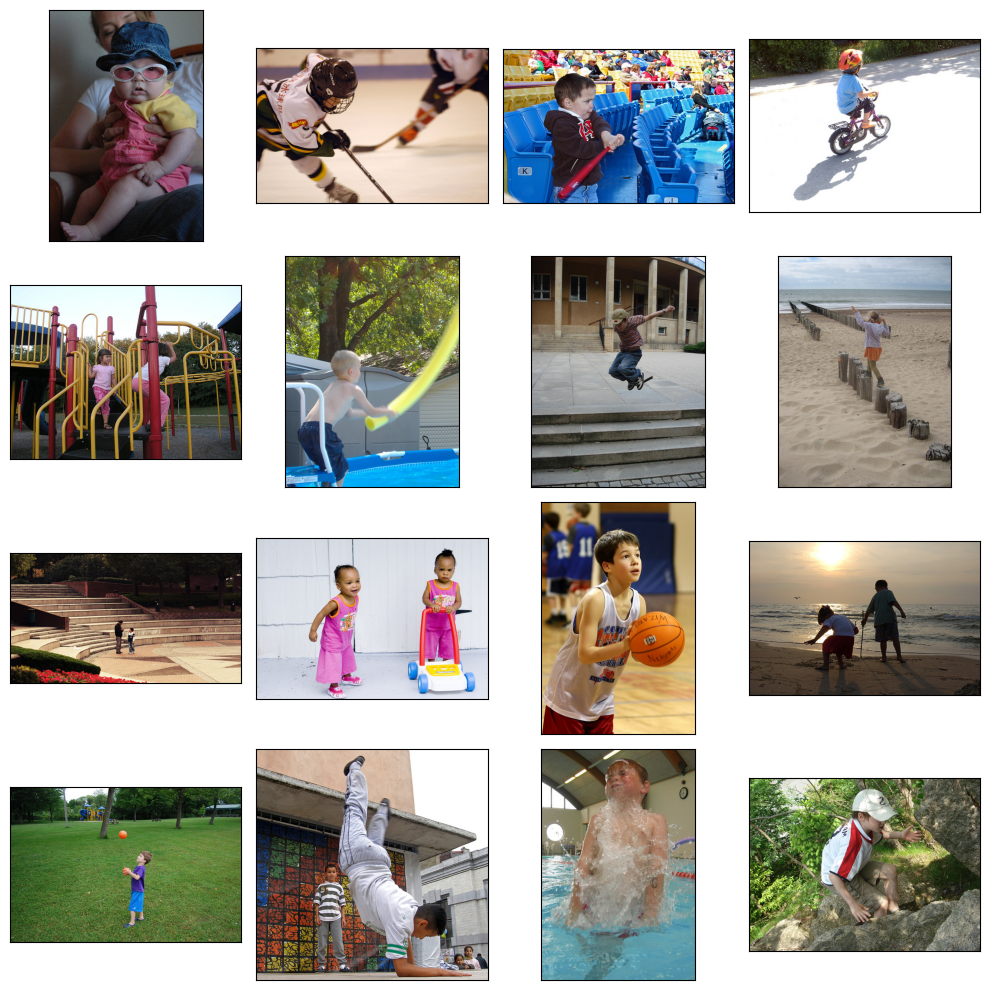

In [67]:
fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(train_images_path, samples_block[i][:-2]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

# Отображение выбранных изображений
plt.show()

In [68]:
# Удаление строк с блокированными изображениями и столбца 'block_words'
train_data = train_data.loc[train_data['block_words'] == 0]
train_data.drop(columns=['block_words'], inplace=True)

train_data.head()

,image,query_id,query_text,score
22,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.000
23,3187395715_f2940c2b72.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.251
24,463978865_c87c6ca84c.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.247
25,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.251
26,534875358_6ea30d3091.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.000


In [69]:
# ИСПРАВЛЕНО Определение списка плохих изображений 
bad_images = set(train_data.query_id[train_data.query_text.str.contains('|'.join(BLOCK_WORDS), case=False)].str[:-2])
bad_images = list(bad_images)

In [70]:
# ИСПРАВЛЕНО Удаление строк с заблокированными изображениями согласно списку
train_data = train_data[~train_data.query_id.str[:-2].isin(bad_images)]

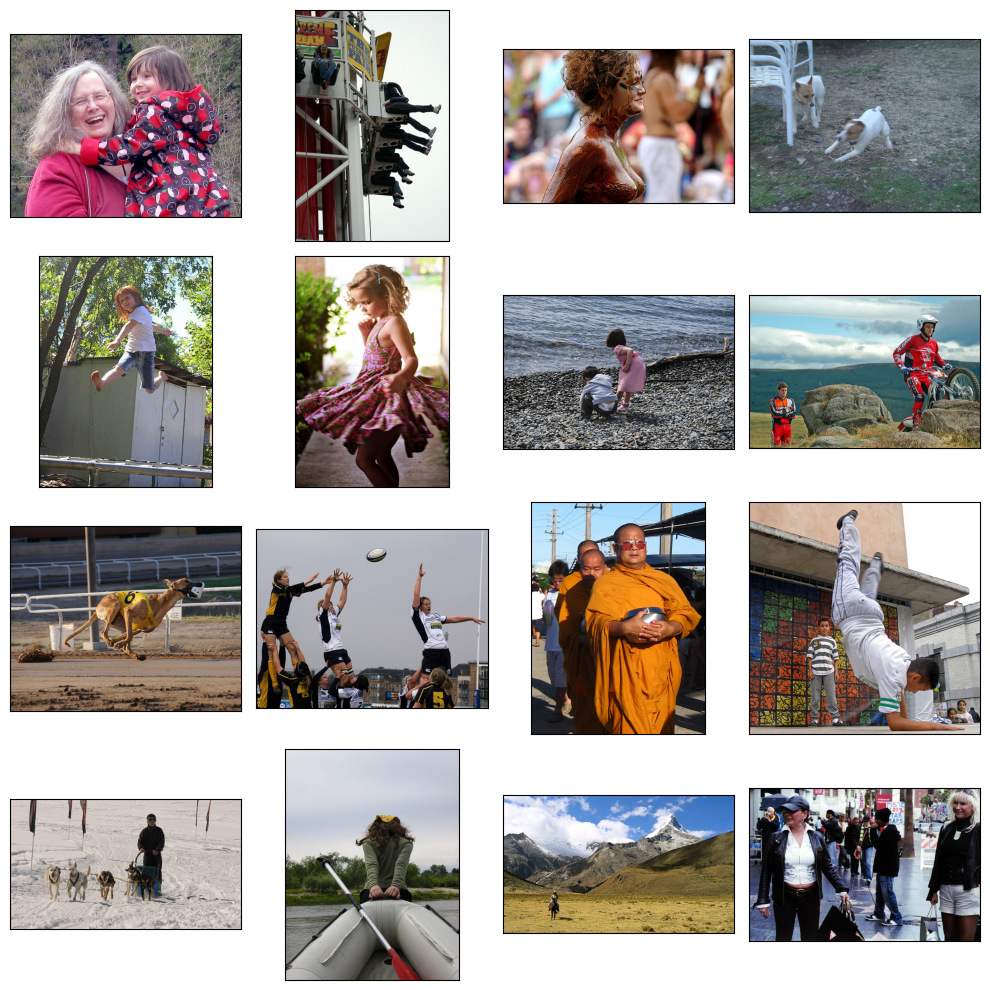

In [71]:
samples_train = list(train_data['image'].sample(16))

fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(train_images_path, samples_train[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

In [72]:
# train_data.head()
# train_data.info()

### Вывод:

На основе проведенных операций удалось исключить из обучающей выборки изображения, связанные с описанием детей  

Однако стоит отметить, что после проведенных манипуляций в новом датафрейме `train_data` все еще присутствуют изображения, связанные с детьми. Эти наблюдения характеризуются низким значением агрегирующей функции score и содержат некорректное описание  

Для выявления таких наблюдений использовался список ключевых слов, включая **['child', 'boy', 'girl', 'baby', 'teen', 'teenager', 'kid', 'infant', 'youngster', 'kids', 'children', 'boys', 'girls', 'babies', 'teens', 'teenagers', 'youth', 'toddler', 'adolescent', 'juvenile', 'offspring', 'minors', 'junior', 'tots', 'youthful', 'newborn', 'offspring', 'little one', 'munchkin', 'toddlers']**, чтобы исключить из обучения изображения, связанные с этими темами  


ИСПРАВЛЕНО: Также был определен список плохих комментариев и привязанных к ним изображений и исключили их из датасета  


Исходя из этой предобработки данных, удалось значительно сократить количество нежелательных изображений и приготовить данные для дальнейшей работы в моделях машинного обучения  

## Векторизация изображений

In [73]:
# Создаем генератор данных для обучения модели
train_datagen = ImageDataGenerator(rescale=1./255)

train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=train_data,
        directory=Path(train_images_path),
        x_col='image',
        y_col='score',
        target_size=(224, 224),
        batch_size=16,
        class_mode='input',
        seed=12345)

# Генерируем и отображаем изображения и их оценки
features, target = train_gen_flow.next()

Found 35745 validated image filenames.


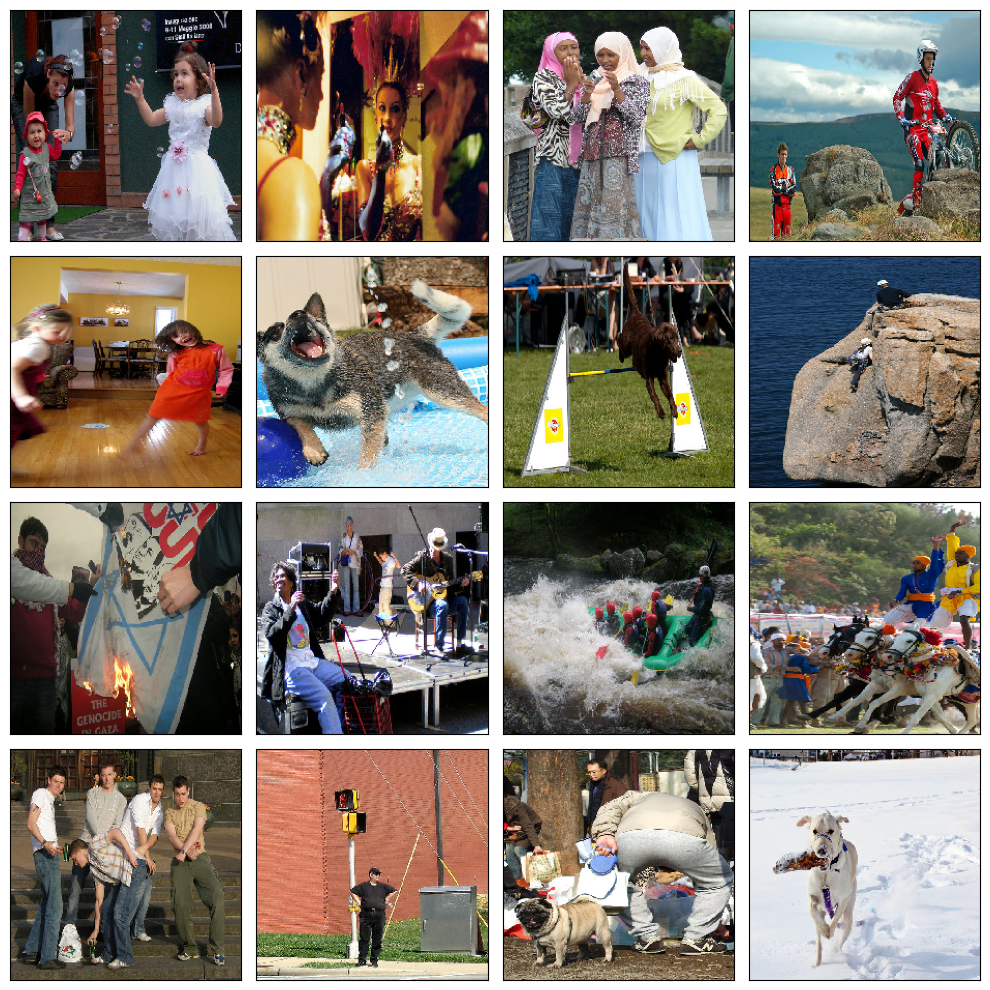

In [74]:
fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

In [75]:
# Создадим свёрточную нейросеть, она позволит извлечь главные компоненты изображений

def create_model():
    # Загружаем предварительно обученную модель ResNet50 без верхних слоев и весов ImageNet
    backbone = ResNet50(input_shape=(224, 224, 3),
                        include_top=False,
                        weights='imagenet')

    model = Sequential()
    # Добавляем загруженную модель как основу
    model.add(backbone)
    # Добавляем слой GlobalAveragePooling2D для усреднения признаков по пространству
    model.add(GlobalAveragePooling2D())
    # Компилируем модель, используя среднеквадратичную ошибку как функцию потерь и оптимизатор Adam с низкой скоростью обучения
    model.compile(loss='mean_squared_error', optimizer=Adam(lr=0.0001), metrics=['mae'])

    return model

In [76]:
def image_vectorization(model, train_data):
    """
    Выполняет векторизацию изображений с использованием заданной модели.

    Args:
        model (tf.keras.models.Model): Модель для векторизации изображений.
        train_data (tf.keras.utils.data.DataGenerator): Генератор данных с изображениями.

    Returns:
        np.ndarray: Векторизованные представления изображений.
    """
    predictions = model.predict(train_data)
    return predictions

In [77]:
# Создадим модель для векторизации изображений
image_model = create_model()

# Выполним векторизацию изображений с использованием созданной модели и генератора данных
image_embeddings = image_vectorization(image_model, train_gen_flow)

# Выведем размерность полученных векторизованных представлений
image_embeddings.shape

2235/2235 [==============================] - 239s 102ms/step


(35745, 2048)

## Векторизация текстов

In [78]:
# Загрузим предобученную модель BERT и предпроцессор для нее
bert_backbone = keras_nlp.models.BertBackbone.from_preset('bert_base_en')
bert_preprocessor = keras_nlp.models.BertPreprocessor.from_preset('bert_base_en')

213450/213450 [==============================] - 0s 0us/step


In [79]:
# Создадим пустой список для хранения векторных представлений текстов и получим тексты из train_data
embeddings = []
text = list(train_data['query_text'])
tokenized = bert_preprocessor(text)
batch_size = 32

# Итерируемся по батчам текстов и вычисляем их векторные представления
for i in notebook.tqdm(range(tokenized['token_ids'].shape[0] // batch_size + 1)):
    tokens = tokenized['token_ids'][batch_size * i:batch_size * (i + 1)]
    token_types = tokenized['segment_ids'][batch_size * i:batch_size * (i + 1)]
    mask = tokenized['padding_mask'][batch_size * i:batch_size * (i + 1)]

    batch = {'token_ids': tokens, 'segment_ids': token_types, 'padding_mask': mask}

    batch_embeddings = bert_backbone.predict(batch, verbose=0)

    embeddings.append(batch_embeddings['pooled_output'])

# Объединим полученные векторные представления
embeddings = np.concatenate(embeddings)

  0%|          | 0/1118 [00:00<?, ?it/s]

## Объединение векторов

In [80]:
# Объединим векторные представления изображений и текста в один признаковый массив
features = np.concatenate((image_embeddings, embeddings), axis=1)

# Получим целевую переменную
target = np.array(train_data['score'])

# Выведем размерности полученных массивов
print("Размерность массива признаков:", features.shape)
print("Размерность целевой переменной:", target.shape)

Размерность массива признаков: (35745, 2816)
Размерность целевой переменной: (35745,)


`Векторизация изображений`  
> Изображения были преобразованы в численные векторы с помощью модели ResNet50. Этот шаг необходим, чтобы мы могли качественно работать с изображениями в математических моделях и сравнивать их с текстовыми описаниями  

`Векторизация текстов`  
>Текстовые описания были также преобразованы в численные векторы. Для этого был применен BERT  

`Объединение векторов`  
>После того как и изображения, и тексты были представлены в виде численных векторов, векторы были объединены. Таким образом был создан набор данных, который будет использоваться в обучении модели для определения соответствия между текстом и изображением  

## Обучение модели предсказания соответствия

In [81]:
# Разделим данные на обучающую и тестовую выборки, учитывая группы изображений
groups = train_data['image']

# Используем GroupShuffleSplit для разделения данных, сохраняя группы изображений вместе
gss = GroupShuffleSplit(n_splits=1, train_size=.6, random_state=12345)
train_indices, test_indices = next(gss.split(X=features, y=target, groups=groups))

# Разделим признаки и целевую переменную на обучающую и тестовую выборки
features_train, features_test = features[train_indices], features[test_indices]
target_train, target_test = target[train_indices], target[test_indices]

# Выведем размерности обучающей и тестовой выборок
print("Размерности обучающей выборки (признаки, целевая переменная):", features_train.shape, target_train.shape)
print("Размерности тестовой выборки (признаки, целевая переменная):", features_test.shape, target_test.shape)

Размерности обучающей выборки (признаки, целевая переменная): (21143, 2816) (21143,)
Размерности тестовой выборки (признаки, целевая переменная): (14602, 2816) (14602,)


In [82]:
# Выведем статистику по признакам в обучающей и тестовой выборках
print('Статистика по обучающей выборке:')
print('Максимальное значение в features_train:', features_train.max())
print('Минимальное значение в features_train:', features_train.min())
print('Среднее значение в features_train:', features_train.mean())
print('Стандартное отклонение в features_train:', features_train.std())

print('\nСтатистика по тестовой выборке:')
print('Максимальное значение в features_test:', features_test.max())
print('Минимальное значение в features_test:', features_test.min())
print('Среднее значение в features_test:', features_test.mean())
print('Стандартное отклонение в features_test:', features_test.std())

Статистика по обучающей выборке:
Максимальное значение в features_train: 15.30311
Минимальное значение в features_train: -1.0
Среднее значение в features_train: 0.07977571
Стандартное отклонение в features_train: 0.6904013

Статистика по тестовой выборке:
Максимальное значение в features_test: 15.30311
Минимальное значение в features_test: -1.0
Среднее значение в features_test: 0.079738066
Стандартное отклонение в features_test: 0.6905664


In [83]:
# Инициализируем и обучаем StandardScaler на обучающих данных
scaler = StandardScaler()
scaler.fit(features_train)

# Преобразуем обучающие и тестовые данные с помощью StandardScaler
features_train = scaler.transform(features_train)
features_test = scaler.transform(features_test)

In [84]:
# Обучим модель линейной регрессии
model_lr = LinearRegression().fit(features_train, target_train)

# Получим прогнозы
predictions = model_lr.predict(features_test)

# Вычислим и выведем RMSE (Корень из среднеквадратичной ошибки)
rmse_lr = np.sqrt(mean_squared_error(target_test, predictions))
print(f'RMSE для модели линейной регрессии: {rmse_lr:.4f}')

RMSE для модели линейной регрессии: 0.2445


In [85]:
# Обучим модель Ridge регрессии (с регуляризацией L2)
model_ridge = Ridge().fit(features_train, target_train)

# Получим прогнозы
predictions_ridge = model_ridge.predict(features_test)

# Вычислим и выведем RMSE (Корень из среднеквадратичной ошибки)
rmse_ridge = np.sqrt(mean_squared_error(target_test, predictions_ridge))
print(f'RMSE для модели Ridge регрессии: {rmse_ridge:.4f}')

RMSE для модели Ridge регрессии: 0.2439


In [86]:
model_nn = Sequential()

model_nn.add(Dense(1024, activation='relu', input_shape=(2816,)))
model_nn.add(BatchNormalization())
model_nn.add(Dense(512, activation='tanh'))
model_nn.add(Dropout(0.2))
model_nn.add(Dense(256, activation='relu'))
model_nn.add(BatchNormalization())
model_nn.add(Dense(128, activation='relu'))
model_nn.add(BatchNormalization())
model_nn.add(Dense(64, activation='relu'))
model_nn.add(Dense(1, activation='linear'))  # убрала Flatten

model_nn.compile(loss='mean_squared_error',
                optimizer=Adam(lr=0.0001),
                metrics=[RootMeanSquaredError()])

In [87]:
# Обучим нейросеть
model_nn.fit(
    features_train,  
    target_train,    
    epochs=24,      # добавила эпохи с 8 до 16  вообще несущественно (RMSE train min = 0.2244 val min = 0.2712), до 24 
    batch_size=32,   
    validation_data=(features_test, target_test),  
    validation_steps=math.ceil(features_train.shape[1] / 32), 
    verbose=2        
)

Epoch 1/24
661/661 - 11s - loss: 0.1098 - root_mean_squared_error: 0.3314 - val_loss: 0.0838 - val_root_mean_squared_error: 0.2894 - 11s/epoch - 16ms/step
Epoch 2/24
661/661 - 4s - loss: 0.0719 - root_mean_squared_error: 0.2681 - val_loss: 0.0766 - val_root_mean_squared_error: 0.2768 - 4s/epoch - 6ms/step
Epoch 3/24
661/661 - 5s - loss: 0.0672 - root_mean_squared_error: 0.2593 - val_loss: 0.0723 - val_root_mean_squared_error: 0.2690 - 5s/epoch - 7ms/step
Epoch 4/24
661/661 - 4s - loss: 0.0644 - root_mean_squared_error: 0.2538 - val_loss: 0.0750 - val_root_mean_squared_error: 0.2739 - 4s/epoch - 7ms/step
Epoch 5/24
661/661 - 4s - loss: 0.0632 - root_mean_squared_error: 0.2514 - val_loss: 0.0675 - val_root_mean_squared_error: 0.2599 - 4s/epoch - 6ms/step
Epoch 6/24
661/661 - 4s - loss: 0.0617 - root_mean_squared_error: 0.2485 - val_loss: 0.0722 - val_root_mean_squared_error: 0.2687 - 4s/epoch - 6ms/step
Epoch 7/24
661/661 - 5s - loss: 0.0611 - root_mean_squared_error: 0.2471 - val_loss: 

Данные для обучения модели подготовлены и разделены на обучающую и тестовую выборки  

Особенностью этой задачи было необходимость учитывать группы изображений, так как они могли быть связаны друг с другом и это создавало созависимость данных  

Для этого был использован метод `GroupShuffleSplit`, который позволил сохранить группы изображений вместе при разделении данных. **Обучающая выборка составила 60% от общего количества данных**  

## Тестирование модели

In [88]:
test_images_path = '/kaggle/input/dsplus-integrated-project-4/to_upload/test_images'
image_filenames = [filename for filename in os.listdir(test_images_path) if filename.endswith('.jpg')]
test_image = pd.DataFrame(image_filenames, columns=['image'])
test_image.name = 'test_image'

In [89]:
# Создадим генератор для тестовых данных
test_datagen = ImageDataGenerator(rescale=1./255) 
test_gen_flow = train_datagen.flow_from_dataframe(
    dataframe=test_image,     
    directory=Path(test_images_path),  
    x_col='image',   
    y_col='score',   
    target_size=(224, 224),  
    batch_size=16,   
    class_mode='input',  
    seed=12345  
)

Found 100 validated image filenames.


In [90]:
# Получим векторные представления изображений для тестовых данных
image_embedings = image_vectorization(create_model(), test_gen_flow)
# Определим размерность полученных векторов
image_embedings.shape

7/7 [==============================] - 3s 234ms/step


(100, 2048)

In [91]:
def txt_vec(text):
    # Создаем список для хранения векторных представлений текстовых данных
    test_embeddings = []
    # Токенизируем и предобрабатываем текст
    tokenized = bert_preprocessor(text)
    batch_size = 4

    # Итерируемся по батчам текстовых данных
    for i in notebook.tqdm(range(tokenized['token_ids'].shape[0] // batch_size + 1)):
        tokens = tokenized['token_ids'][batch_size * i:batch_size * (i + 1)]
        token_types = tokenized['segment_ids'][batch_size * i:batch_size * (i + 1)]
        mask = tokenized['padding_mask'][batch_size * i:batch_size * (i + 1)]
        batch = {'token_ids': tokens,
                 'segment_ids': token_types,
                 'padding_mask': mask}
        # Извлекаем векторные представления с помощью модели BERT
        batch_embeddings = bert_backbone.predict(batch, verbose=0)
        test_embeddings.append(batch_embeddings['pooled_output'])

    # Объединяем векторные представления в один массив
    text_embeddings_test = np.concatenate(test_embeddings)
    return text_embeddings_test

In [92]:
def inference(text):
    # Проверяем оригинальный текст на наличие запрещенных слов
    bin_array = [word for word in text.split() if word in BLOCK_WORDS] # ИСПРАВЛЕНО вместо лемматизации используем split 
    if bin_array:
        # Если найдены запрещенные слова, выводим сообщение о недоступности изображения
        print('-' * 100)
        print()
        print(text)
        print()
        print('#' * 77)
        s = 'This image is unavailable in your country in compliance with local laws'.upper()
        print(f'## {s} ##')
        print('#' * 77)
        print()
    else:
        # Если запрещенных слов нет, выполняем инференс
        text_embed = txt_vec(text=[text])
        feature = np.concatenate((image_embedings, np.resize(text_embed, (image_embedings.shape[0], 768))), axis=1)
        feature = scaler.transform(feature)
        predictions = model_nn.predict(feature)

        data = pd.concat((test_image, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='predictions')), axis=1)
        top = list(data.sort_values(by='predictions', ascending=False)['image'].head(5))
        top_score = list(data.sort_values(by='predictions', ascending=False)['predictions'].head(5))

        print()
        print(text)
        print()

        # Отображаем топ-5 изображений с наивысшими предсказанными оценками
        fig = plt.figure(figsize=(15, 6))
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i + 1, title=round(top_score[i], 2))
            image = Image.open(Path(test_images_path, top[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        # Если текст запроса совпадает с текстом в тестовой выборке, выделяем изображение зеленым цветом
        if text in list(test_query['query_text']):
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(test_images_path, test_query.iloc[test_query[test_query['query_text'] == text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
            print()

        plt.show()

        print('-' * 100)
    return None

In [93]:
# def inference(text):
#     # Проверяем текст на наличие запрещенных слов
#     bin_array = [i for i in lemmatize_text(text) if i in BLOCK_WORDS]
#     if bin_array:
#         # Если найдены запрещенные слова, выводим сообщение о недоступности изображения
#         print('-' * 100)
#         print()
#         print(text)
#         print()
#         print('#' * 77)
#         s = 'This image is unavailable in your country in compliance with local laws'.upper()
#         print(f'## {s} ##')
#         print('#' * 77)
#         print()
#     else:
#         # Если запрещенных слов нет, выполняем инференс
#         text_embed = txt_vec(text=[text])
#         feature = np.concatenate((image_embedings, np.resize(text_embed, (image_embedings.shape[0], 768))), axis=1)
#         feature = scaler.transform(feature)
#         predictions = model_nn.predict(feature)

#         data = pd.concat((test_image, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='predictions')), axis=1)
#         top = list(data.sort_values(by='predictions', ascending=False)['image'].head(5))
#         top_score = list(data.sort_values(by='predictions', ascending=False)['predictions'].head(5))

#         print()
#         print(text)
#         print()

#         # Отображаем топ-5 изображений с наивысшими предсказанными оценками
#         fig = plt.figure(figsize=(15, 6))
#         plt.rcParams['axes.edgecolor'] = 'black'
#         plt.rcParams['axes.linewidth'] = 0
#         for i in range(5):
#             fig.add_subplot(1, 6, i + 1, title=round(top_score[i], 2))
#             image = Image.open(Path(test_images_path, top[i]))
#             plt.imshow(image)
#             plt.xticks([])
#             plt.yticks([])
#             plt.tight_layout()

#         # Если текст запроса совпадает с текстом в тестовой выборке, выделяем изображение зеленым цветом
#         if text in list(test_query['query_text']):
#             plt.rcParams['axes.edgecolor'] = 'green'
#             plt.rcParams['axes.linewidth'] = 5
#             fig.add_subplot(1, 6, 6)
#             image = Image.open(Path(test_images_path, test_query.iloc[test_query[test_query['query_text'] == text].index[0]]['image']))
#             plt.imshow(image)
#             plt.xticks([])
#             plt.yticks([])
#             plt.tight_layout()
#             print()

#         plt.show()

#         print('-' * 100)
#     return None

  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 5ms/step

A white dog with a branch in his mouth and a black dog .




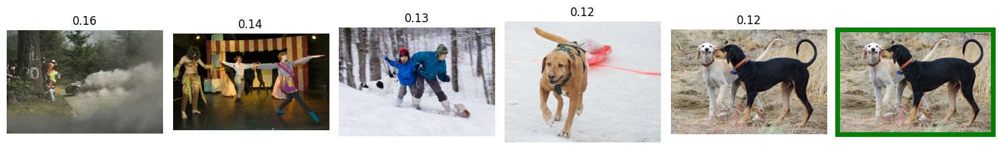

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

a guy and a girl jumping up in the air

#############################################################################
## THIS IMAGE IS UNAVAILABLE IN YOUR COUNTRY IN COMPLIANCE WITH LOCAL LAWS ##
#############################################################################



  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 3ms/step

the man is wearing a backpack and sunglasses while walking through an outdoor market .




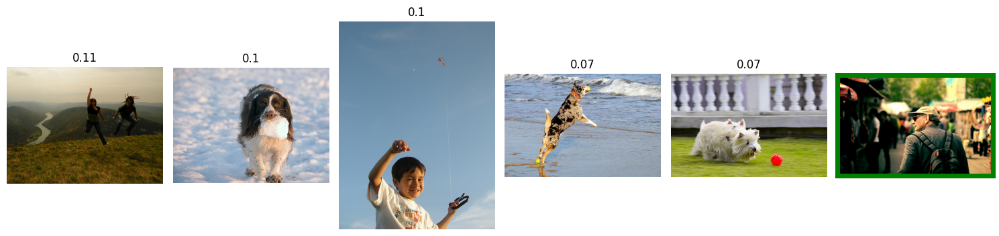

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 3ms/step

a man leans against a large robot .




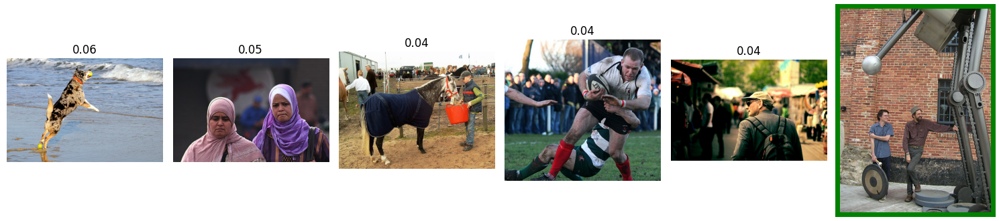

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 3ms/step

A man sits on the gravel by an ocean .




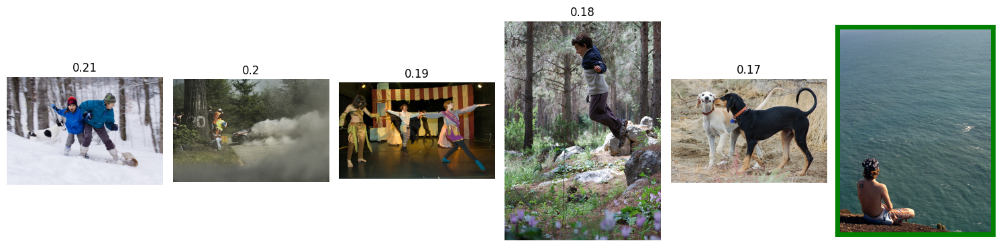

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 3ms/step

A white dog with beige spots is running through a field .




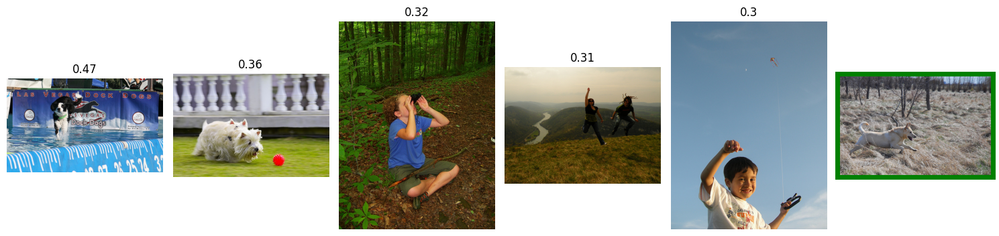

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 3ms/step

A brown dog is sitting in some long grass .




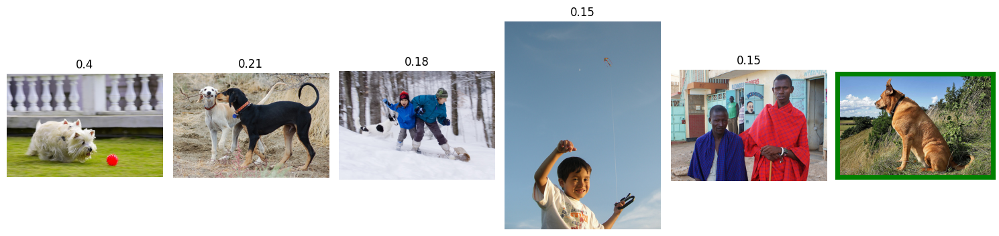

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 3ms/step

A salt-and-pepper-haired man with beard and glasses wearing black sits on the grass .




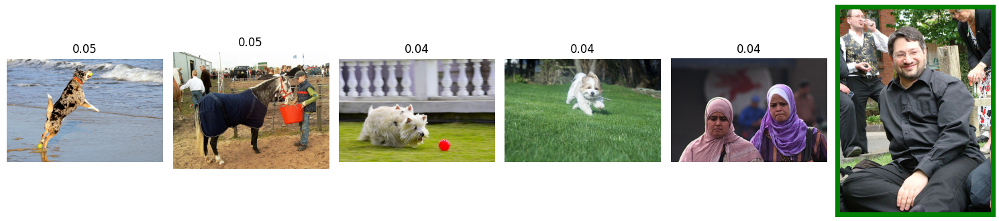

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 3ms/step

A blue bird flying over water .




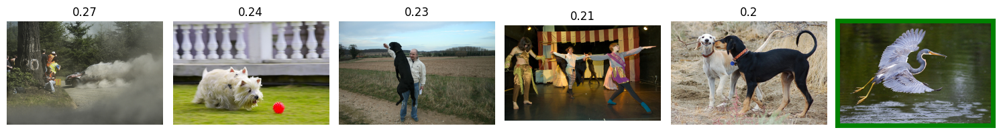

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 3ms/step

Girls with orange hair standing on the street with some kind of bottle in their hand .




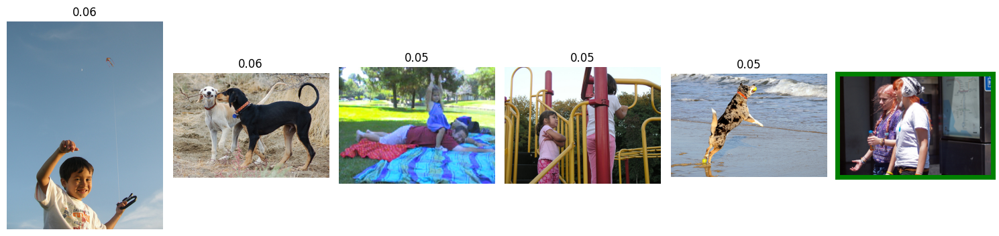

----------------------------------------------------------------------------------------------------


In [94]:
# Выбираем 10 случайных фраз из тестовой выборки и выполняем инференс для каждой из них
test_phrases = list(test_query['query_text'].sample(10))
for phrase in test_phrases:
    inference(phrase)

## Вывод:  

Итак, разработан функционал для сортировки изображений на основе текстовых запросов  

`Рассмотрим ключевые шаги и их анализ:`  

>Создание генератора для тестовых данных: Генератор данных для тестовых изображений, который позволил подавать изображения на вход модели для получения их векторных представлений  

>Векторизация изображений для тестовых данных: Для тестовых данных получены векторные представления изображений, используя модель ResNet50. Эти векторы будут использоваться в дальнейшем для сравнения с векторами текстовых запросов  

>Функция txt_vec для векторизации текста: Написана функция txt_vec, которая выполняет векторизацию текстовых запросов с использованием модели BERT. Эта функция принимает текстовый запрос, токенизирует его и получает векторное представление с помощью модели BERT. Здесь также учтены возможные ограничения на запрещенные слова  

>Функция inference для вывода результатов выполняет следующие действия:  

* Проверяет текстовый запрос на наличие запрещенных слов. Если такие слова обнаружены, выводится сообщение о недоступности изображения в соответствии с местными законами  
* Если запрещенных слов нет, выполняется запрос. Текстовый запрос векторизуется, и его вектор объединяется с векторами изображений  
* Полученные признаки масштабируются, и затем используется модель для предсказания оценок соответствия между текстовыми запросами и изображениями  
* Топ-5 изображений с наивысшими предсказанными оценками отображаются с указанием предсказанных оценок
* Если текст запроса совпадает с текстом в тестовой выборке, изображение выделяется зеленым цветом  

# Общий вывод: 

`Исследовательский анализ данных:`  

>В этой части работы было проведено обширное исследование данных, включая датафреймы `train_data`, `CrowdAnnotations` и `ExpertAnnotations`. Основной акцент был сделан на подготовке данных для обучения модели. Были протестированы различные модели, включая линейную регрессию и случайный лес, для заполнения пропущенных значений и предсказания метрики `fraction`. Также было выявлено, что некоторые изображения нарушают правила юридической безопасности, и их следует исключить из обучающей выборки. Общая обучающая выборка была подготовлена и содержит `50 214 записей`  

`Проверка данных на юридическое соответствие:`  

>Была проведена проверка изображений на соответствие требованиям по юридической безопасности. Изображения, связанные с детьми до 16 лет, были удалены из обучающей выборки  

`Векторизация изображений:`  

>Изображения были преобразованы в численные векторы с использованием модели `ResNet50`. Это позволило представить изображения в виде чисел и использовать их в моделях машинного обучения  

`Векторизация текстов:`  

>Текстовые описания были векторизованы с использованием модели `BERT`. Это позволило представить тексты в виде численных векторов, что необходимо для сравнения с векторами изображений  

`Объединение векторов:`  

>Векторы изображений и текстов были объединены в один признаковый массив, который используетсядля обучения модели предсказания соответствия между изображением и текстовым запросом  

`Обучение модели соответствия:`  

>Данные были разделены на обучающую и тестовую выборки с учетом групп изображений. Модель машинного обучения была обучена на подготовленных данных  

`Функции для сортировки по текстовым запросам:`  

>Были разработаны функции для сортировки изображений на основе текстовых запросов. Функция `txt_vec` векторизирует текст, а функция `inference` выполняет предсказания соответствия между текстом и изображением, а также выводит топ-5 изображений с наивысшими предсказанными оценками


Общий вывод заключается в том, что данные были успешно подготовлены и векторизованы для обучения модели, а также проведена проверка на юридическое соответствие. Модель машинного обучения и нейронная сеть были обучены для предсказания соответствия между изображениями и текстовыми запросами. Теперь система готова к использованию для сортировки изображений на основе текстовых запросов  